## Using models from Qualcomm AI Hub for inferencing on cloud based devices/services or on actual physical device

In [2]:
from qai_hub_models.models.ffnet_40s import Model

In [3]:
from torchinfo import summary

In [5]:
model = Model.from_pretrained()
input_shape  = (1,3,1024,2048)
stats=  summary(
    model,
    input_size= input_shape,
    col_names=["num_params", "mult_adds"]
)
print(stats)

Loading pretrained model state dict from /Users/aniketkundu12072004/.qaihm/models/ffnet/v1/ffnet40S/ffnet40S_dBBB_cityscapes_state_dict_quarts.pth
Initializing ffnnet40S_dBBB_mobile weights
Layer (type:depth-idx)                                       Param #                   Mult-Adds
FFNet40S                                                     --                        --
├─FFNet: 1-1                                                 --                        --
│    └─ResNetS: 2-1                                          --                        --
│    │    └─Conv2d: 3-1                                      864                       452,984,832
│    │    └─BatchNorm2d: 3-2                                 64                        64
│    │    └─ReLU: 3-3                                        --                        --
│    │    └─Conv2d: 3-4                                      18,432                    2,415,919,104
│    │    └─BatchNorm2d: 3-5                                 12

In [ ]:
print(stats)

In [9]:
key = ""
with open("key.txt") as file:
    key = file.read()
!qai-hub configure --api_token $key

/Users/aniketkundu12072004/StanfordOnline/Qualcomm_on_device_AI/env/lib/python3.9/site-packages/qai_hub/_cli.py:272: UserWarning: Overwriting configuration: /Users/aniketkundu12072004/.qai_hub/client.ini (previous configuration saved to /Users/aniketkundu12072004/.qai_hub/client.ini.bak)
  warnings.warn(
qai-hub configuration saved to /Users/aniketkundu12072004/.qai_hub/client.ini
==================== /Users/aniketkundu12072004/.qai_hub/client.ini ====================
[api]
api_token = dae3c6317feec86dfe3c34bfdb9574d2fb8bc732
api_url = https://app.aihub.qualcomm.com
web_url = https://app.aihub.qualcomm.com
verbose = True




In [10]:
import qai_hub


Loading pretrained model state dict from /Users/aniketkundu12072004/.qaihm/models/ffnet/v1/ffnet40S/ffnet40S_dBBB_cityscapes_state_dict_quarts.pth
Initializing ffnnet40S_dBBB_mobile weights
Running Inference on 0 samples


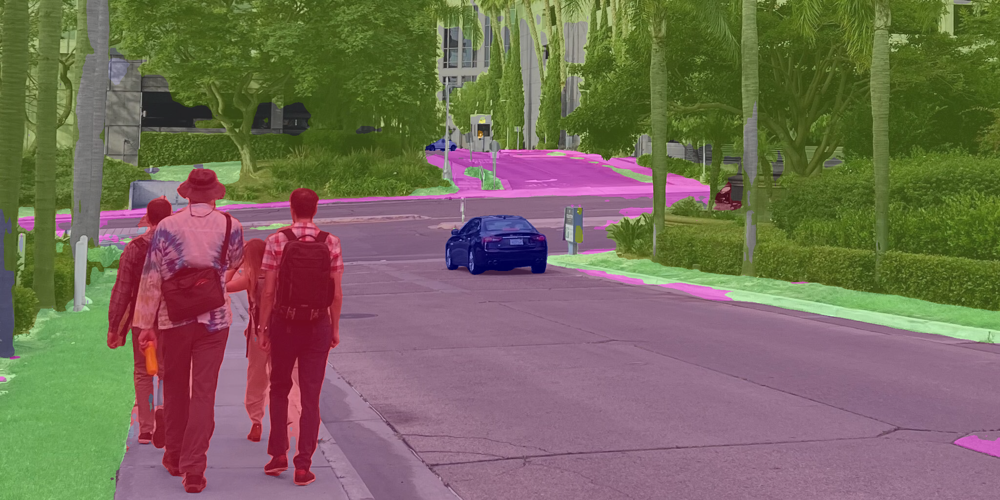

In [13]:
# a demonstration of the ffnet_40s model from Qualcomm AI Hub on a sample input from the cloud
%run -m qai_hub_models.models.ffnet_40s.demo

In [14]:
# running inference on a cloud service hosting the intended device
selected_device = "Samsung Galaxy S22+ 5G"

%run -m qai_hub_models.models.ffnet_40s.export -- --device "$selected_device"

Loading pretrained model state dict from /Users/aniketkundu12072004/.qaihm/models/ffnet/v1/ffnet40S/ffnet40S_dBBB_cityscapes_state_dict_quarts.pth
Initializing ffnnet40S_dBBB_mobile weights
Optimizing model ffnet_40s to run on-device.


Uploading model: 100%|██████████| 53.6M/53.6M [04:44<00:00, 198kB/s]   


Scheduled compile job (jmg9xqeqg) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/jmg9xqeqg/

Profiling model ffnet_40s on a hosted device.
Waiting for compile job (jmg9xqeqg) completion. Type Ctrl+C to stop waiting at any time.
    ✅ SUCCESS                          
Scheduled profiling job (jnp1vmxkp) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/jnp1vmxkp/

Running inference for ffnet_40s on a hosted device with example inputs.


Uploading dataset: 100%|██████████| 21.5M/21.5M [00:19<00:00, 1.17MB/s]


Scheduled inference job (jvgdzmlk5) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/jvgdzmlk5/



job_jmg9xqeqg_optimized_tflite_mkqp1g9vq.tflite: 100%|██████████| 53.1M/53.1M [02:42<00:00, 342kB/s] 



------------------------------------------------------------
Performance results on-device for Ffnet_40S.
------------------------------------------------------------
Device                          : Samsung Galaxy S22+ 5G (12)
Runtime                         : TFLITE                     
Estimated inference time (ms)   : 27.9                       
Estimated peak memory usage (MB): [3, 87]                    
Total # Ops                     : 92                         
Compute Unit(s)                 : NPU (92 ops)               
------------------------------------------------------------
More details: https://app.aihub.qualcomm.com/jobs/jnp1vmxkp/



dataset-dr9wlwnw7.h5: 100%|██████████| 1.22M/1.22M [00:09<00:00, 133kB/s] 


Comparing on-device vs. local-cpu inference for Ffnet_40S.
+---------------+-------------------+--------+
| output_name   | shape             |   psnr |
+===============+===================+========+
| output_0      | (1, 19, 128, 256) |  66.24 |
+---------------+-------------------+--------+

- psnr: Peak Signal-to-Noise Ratio (PSNR). >30 dB is typically considered good.

More details: https://app.aihub.qualcomm.com/jobs/jvgdzmlk5/


In [ ]:
# running inference on an actual device
%run -m qai_hub_models.models.ffnet_40s.demo -- --device "$selected_device" --on-device

# Quantizing Models

In [5]:
from datasets import load_dataset

input_shape = (1,3,1024,2048)

dataset = load_dataset("UrbanSyn/UrbanSyn", split = "train", data_files="rgb/*_00*.png")
dataset  = dataset.train_test_split(1)  

calibration_dataset = dataset["train"]
test_dataset = dataset["test"]

Generating train split: 99 examples [00:00, 325.22 examples/s]


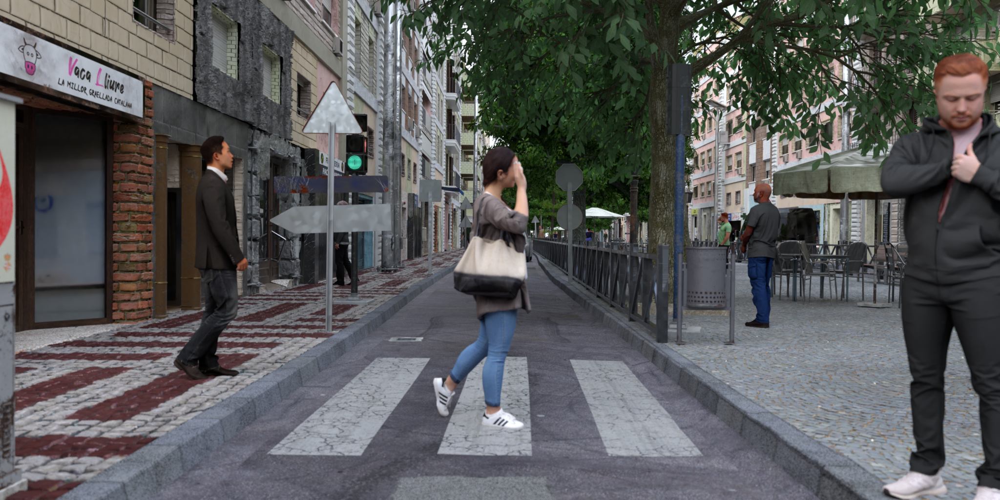

In [6]:
calibration_dataset["image"][0]

In [13]:
import torch
from torchvision import transforms

# convert the PIL image above into Torch Tensor
preprocess = transforms.ToTensor()

# get a sample image in the test dataset
test_sample_pil = test_dataset[0]["image"]
test_sample = preprocess(test_sample_pil).unsqueeze(0)
print(test_sample)

tensor([[[[0.3176, 0.3176, 0.3137,  ..., 0.4510, 0.4627, 0.4667],
          [0.3255, 0.3216, 0.3176,  ..., 0.4706, 0.4784, 0.4706],
          [0.3216, 0.3216, 0.3176,  ..., 0.4784, 0.4745, 0.4627],
          ...,
          [0.2510, 0.2471, 0.2431,  ..., 0.2667, 0.2549, 0.2431],
          [0.2510, 0.2471, 0.2471,  ..., 0.2784, 0.2784, 0.2667],
          [0.2471, 0.2510, 0.2471,  ..., 0.2784, 0.2784, 0.2863]],

         [[0.2745, 0.2745, 0.2706,  ..., 0.4667, 0.4784, 0.4863],
          [0.2784, 0.2745, 0.2745,  ..., 0.4863, 0.4980, 0.4902],
          [0.2784, 0.2745, 0.2745,  ..., 0.4980, 0.4941, 0.4784],
          ...,
          [0.2627, 0.2627, 0.2627,  ..., 0.3020, 0.2824, 0.2745],
          [0.2627, 0.2627, 0.2627,  ..., 0.3137, 0.3098, 0.3020],
          [0.2627, 0.2667, 0.2627,  ..., 0.3098, 0.3137, 0.3137]],

         [[0.2431, 0.2392, 0.2353,  ..., 0.4784, 0.4980, 0.5020],
          [0.2431, 0.2392, 0.2392,  ..., 0.5020, 0.5216, 0.5098],
          [0.2471, 0.2431, 0.2392,  ..., 0

## Set up calibration or inference pipeline

In [14]:
import torch.nn.functional as F
import numpy as np
from PIL import Image

def postprocess(output_tensor, input_image_pil):

    # Upsample the output to the original size
    output_tensor_upsampled = F.interpolate(
        output_tensor, input_shape[2:], mode="bilinear",
    )

    # Get top predicted class and convert to numpy
    output_predictions = output_tensor_upsampled[0].argmax(0).byte().detach().numpy().astype(np.uint8)

    # Overlay over original image
    color_mask = Image.fromarray(output_predictions).convert("P")

    # Create an appropriate palette for the Cityscapes classes
    palette = [
        128, 64, 128, 244, 35, 232, 70, 70, 70, 102, 102, 156,
        190, 153, 153, 153, 153, 153, 250, 170, 30, 220, 220, 0,
        107, 142, 35, 152, 251, 152, 70, 130, 180, 220, 20, 60,
        255, 0, 0, 0, 0, 142, 0, 0, 70, 0, 60, 100, 0, 80, 100,
        0, 0, 230, 119, 11, 32]
    palette = palette + (256 * 3 - len(palette)) * [0]
    color_mask.putpalette(palette)
    out = Image.blend(input_image_pil, color_mask.convert("RGB"), 0.5)
    return out

## Set up model in Float32

Loading pretrained model state dict from /Users/aniketkundu12072004/.qaihm/models/ffnet/v1/ffnet40S/ffnet40S_dBBB_cityscapes_state_dict_quarts.pth
Initializing ffnnet40S_dBBB_mobile weights
tensor([[[[ -4.4428,  -7.1260,  -7.3178,  ...,  -4.2100,  -4.4560,  -2.8168],
          [ -6.1202,  -9.1879, -10.0573,  ...,  -5.2154,  -5.3757,  -3.4189],
          [ -6.6941,  -9.1464, -10.1601,  ...,  -5.9728,  -5.8583,  -3.6571],
          ...,
          [  4.7567,   6.9456,   7.5347,  ...,  -4.8319,  -4.8801,  -4.4019],
          [  4.2368,   6.2581,   6.8708,  ...,  -4.5288,  -4.6443,  -3.7722],
          [  3.4006,   5.2239,   5.2823,  ...,  -3.6044,  -3.2598,  -2.0423]],

         [[ -6.9115,  -9.1484,  -7.5528,  ...,  -5.6396,  -5.4679,  -3.9804],
          [ -9.5836, -13.2042, -11.1754,  ...,  -7.8281,  -7.6850,  -5.8039],
          [ -9.9308, -13.7526, -11.5701,  ...,  -8.5161,  -8.6152,  -6.5976],
          ...,
          [ -5.0264,  -6.5929,  -6.6645,  ...,   4.2510,   4.0247,   3.4774]

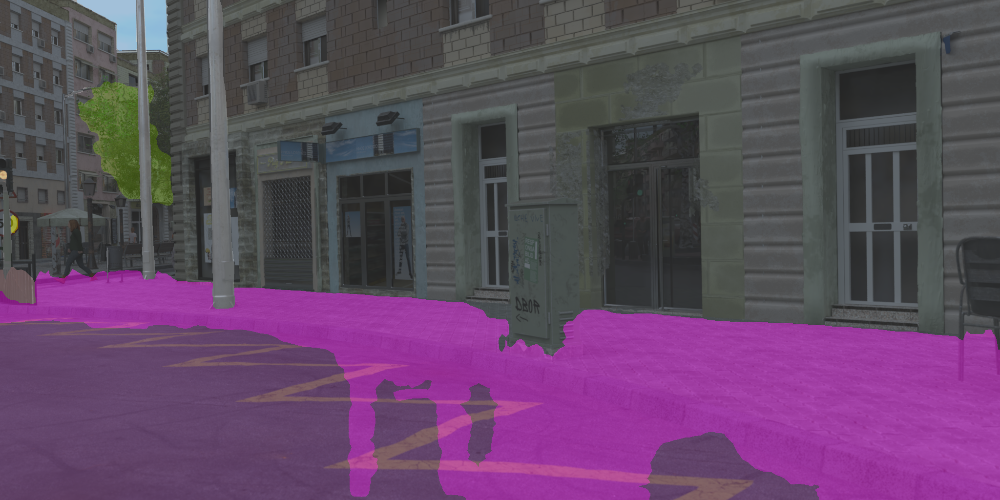

In [15]:
from qai_hub_models.models.ffnet_40s.model import FFNet40S
model = FFNet40S.from_pretrained().model.eval()

with torch.no_grad():
    test_output_fp32 = model(test_sample)
    print(test_output_fp32)
postprocess(test_output_fp32, test_sample_pil)


## Prepare Qauntized Model

In [ ]:
from qai_hub_models.models._shared.ffnet_quantized.model import FFNET_AIMET_CONFIG
from aimet_torch.batch_norm_fold import fold_all_batch_norms
from aimet_torch.model_preparer import prepare_model
from aimet_torch.quantsim import QuantizationSimModel

# Prepare model for 8-bit quantization
fold_all_batch_norms(model, [input_shape])
model = prepare_model(model)

# Setup quantization simulator
quant_sim = QuantizationSimModel(
    model,
    quant_scheme="tf_enhanced",
    default_param_bw=8,              # Use bitwidth 8-bit
    default_output_bw=8,
    config_file=FFNET_AIMET_CONFIG,
    dummy_input=torch.rand(input_shape),
)